In [1]:
import shutil
import pandas as pd
import numpy as np
from bifacial_peak_shaving import *
from data_processing import *
pd.options.plotting.backend='matplotlib'

# Data

In [2]:
#data_dir = r'~/OneDrive/Data'
data_dir = r'C:/Users/Admin/OneDrive - Politecnico di Milano/Data'

output_filename_stub = r'Output/caltech_ev_mjw8__output__'

## Load

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 31927 entries, 2018-04-25 03:00:00 to 2019-03-23 16:30:00
Data columns (total 1 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Load (kW)  31927 non-null  float64
dtypes: float64(1)
memory usage: 498.9 KB
None
          Load (kW)
count  31927.000000
mean      20.562064
std       20.191979
min        0.000000
25%        4.598431
50%       13.701633
75%       32.122886
max      117.733400


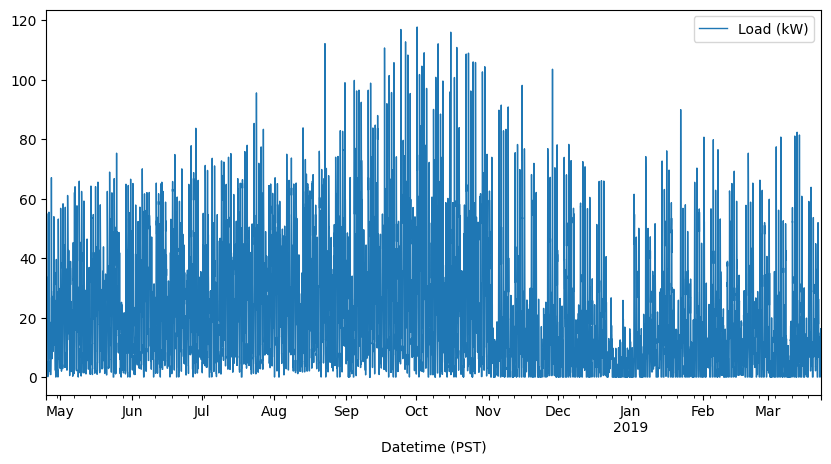

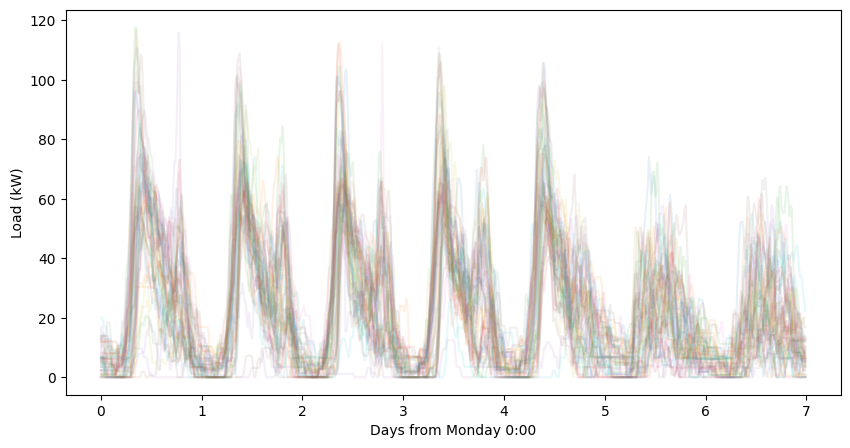

In [3]:
load_file = r'/Load/Vehicle/ACN/old/acn_caltech.csv'

#shutil.copyfile(data_dir+load_file, r'./Data/'+load_file.split('/')[-1])

load = pd.read_csv(data_dir + r'/Load/Vehicle/ACN/old/acn_caltech.csv',
                   index_col=0,
                   parse_dates=True,
                   comment='#',)
                    #.resample('1h').mean()\
                    #.fillna(method='ffill')
                    #.loc['2018-4-26':'2019-3-22']
#load = pd.DataFrame({'Load (kW)':list(load.loc['2019-1-2 0:00':'2019-1-2 16:00','Load (kW)'])+list(load.loc[:,'Load (kW)'])},
#                     index=pd.date_range('2019-1-1 0:00',periods=8760,freq='1h'))
#load.loc['2019-5-20'] = load.loc['2019-5-22'].values
#load.loc['2019-5-21'] = load.loc['2019-5-22'].values
#load.index = pd.date_range('1901-1-1 0:00',periods=35040,freq='15min')
load = load.fillna(method='ffill')
#interval_min = int(load.index.to_series().diff().mean().seconds/60)
#load = load.resample('30min').mean()
load.plot(figsize=(10,5),linewidth=1)
#load = load.loc['2018-5-1':'2019-2-28']
print(load.info())
print(load.describe())
plot_weekly(load['Load (kW)'])


## Solar

- 7 kWp, TMY

- Net zero capacity

  - $capacity[kWp] = production[kWh] \times yield [\frac{kWh}{kWp}]^{-1}$

In [4]:
solar_angles = ['s20','w90','s20w90']

dir_solar = data_dir + r'/Solar/Modelled/'

s20 = pd.concat((pd.read_csv(dir_solar+'pasadena_2018_15min_367mods_s20.csv',index_col=0,parse_dates=True,comment='#'),
                 pd.read_csv(dir_solar+'pasadena_2019_15min_367mods_s20.csv',index_col=0,parse_dates=True,comment='#')))

w90 = pd.concat((pd.read_csv(dir_solar+'pasadena_2018_15min_367mods_w90.csv',index_col=0,parse_dates=True,comment='#'),
                 pd.read_csv(dir_solar+'pasadena_2019_15min_367mods_w90.csv',index_col=0,parse_dates=True,comment='#')))

s20w90 = pd.concat((pd.read_csv(dir_solar+'pasadena_2018_15min_367mods_s20w90.csv',index_col=0,parse_dates=True,comment='#'),
                    pd.read_csv(dir_solar+'pasadena_2019_15min_367mods_s20w90.csv',index_col=0,parse_dates=True,comment='#')))

solar = pd.concat((s20,w90,s20w90),axis=1)
solar.columns=solar_angles

#solar = solar.resample('1h').mean()

solar = solar.loc[load.index] # make same length as load

#net_zero_capacity = load['Load (kW)'].sum() / (solar.s20.sum()) # load=production / yield
#solar = solar * net_zero_capacity # scale to net 0

print(solar.info(),'\n')
print(solar.describe())
solar

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 31927 entries, 2018-04-25 03:00:00 to 2019-03-23 16:30:00
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   s20     31927 non-null  float64
 1   w90     31927 non-null  float64
 2   s20w90  31927 non-null  float64
dtypes: float64(3)
memory usage: 997.7 KB
None 

                s20           w90        s20w90
count  31927.000000  31927.000000  31927.000000
mean      20.939515     17.959353     19.418192
std       29.224585     24.127443     24.636925
min       -0.067293     -0.067571     -0.064107
25%       -0.008155     -0.008155     -0.008155
50%       -0.008155     -0.008155     -0.008155
75%       44.705200     35.437400     44.209050
max      109.694000     89.799000     83.972900


,s20,w90,s20w90
Datetime (PST),,,
2018-04-25 03:00:00,-0.008155,-0.008155,-0.008155
2018-04-25 03:15:00,-0.008155,-0.008155,-0.008155
2018-04-25 03:30:00,-0.008155,-0.008155,-0.008155
2018-04-25 03:45:00,-0.008155,-0.008155,-0.008155
2018-04-25 04:00:00,-0.008155,-0.008155,-0.008155
...,...,...,...
2019-03-23 15:30:00,17.995300,17.280600,17.588300
2019-03-23 15:45:00,17.995300,17.280600,17.588300
2019-03-23 16:00:00,13.553100,12.408300,12.943800


In [5]:
# for col in solar:
#     plot_daily(solar[col],title=col)#,interval_min=60)

## Net load

In [6]:
solar.index = load.index # seems unnecessary
df = pd.concat((load,solar),axis=1)
df.columns = ['load'] + ['solar_'+x for x in solar.columns]
for angle in solar.columns:
    df[f'netload_{angle}'] = df['load'] - solar[angle]

load v s20

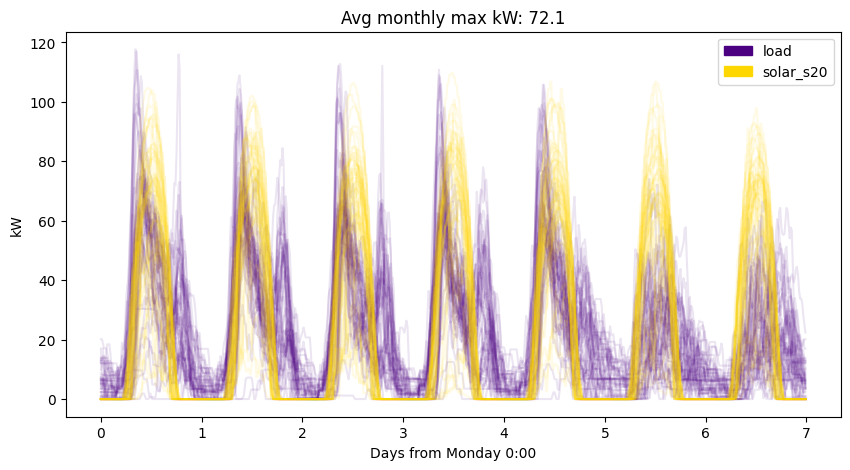

In [7]:
l = df['load']
s = df['solar_s20']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly((l,s),f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

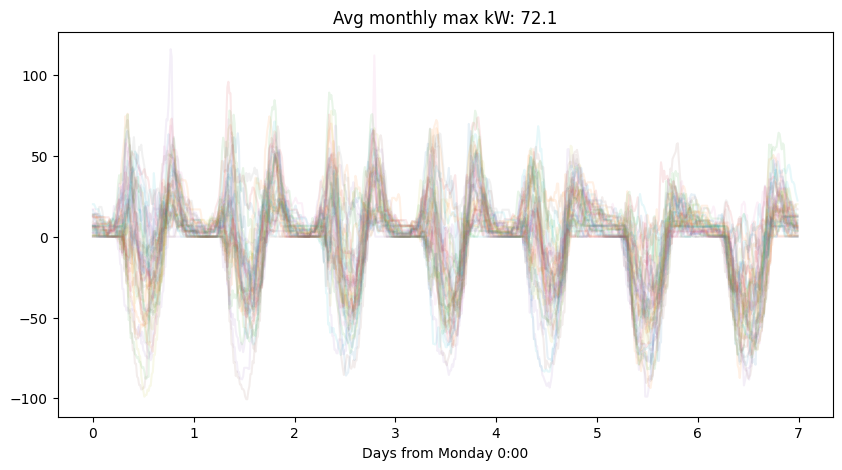

In [8]:
l = df['load']
s = df['solar_s20']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly(l-s,f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

load v w20

In [9]:
# l = df['load']
# s = df['solar_w20']
# avg_monthly_max = (l - s).resample('1M').max().mean()  
# plot_weekly((l,s),f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

In [10]:
# l = df['load']
# s = df['solar_w20']
# avg_monthly_max = (l - s).resample('1M').max().mean()  
# plot_weekly(l-s,f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

load v w90

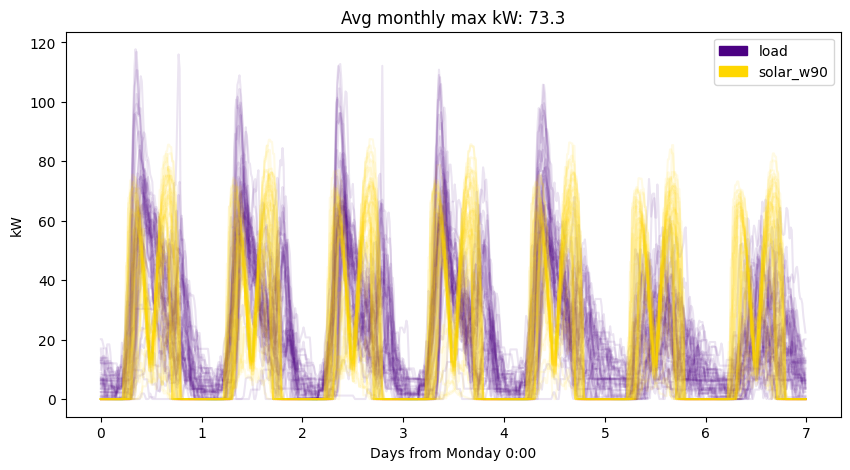

In [11]:
l = df['load']
s = df['solar_w90']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly((l,s),f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

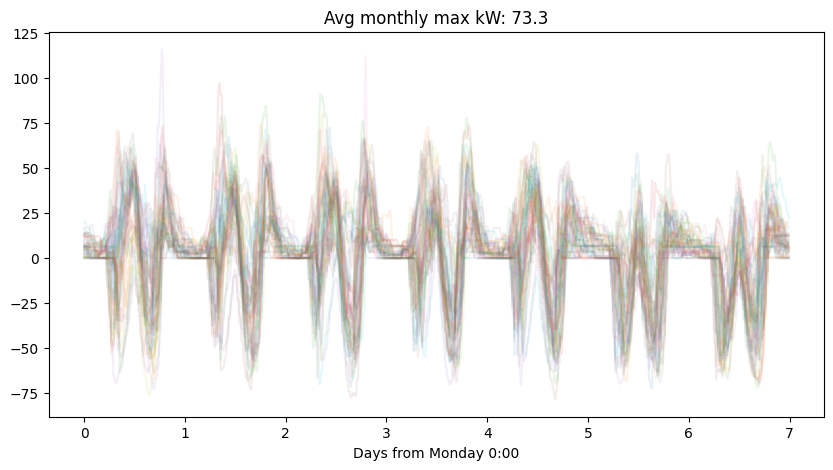

In [12]:
l = df['load']
s = df['solar_w90']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly(l-s,f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

load v s20w90

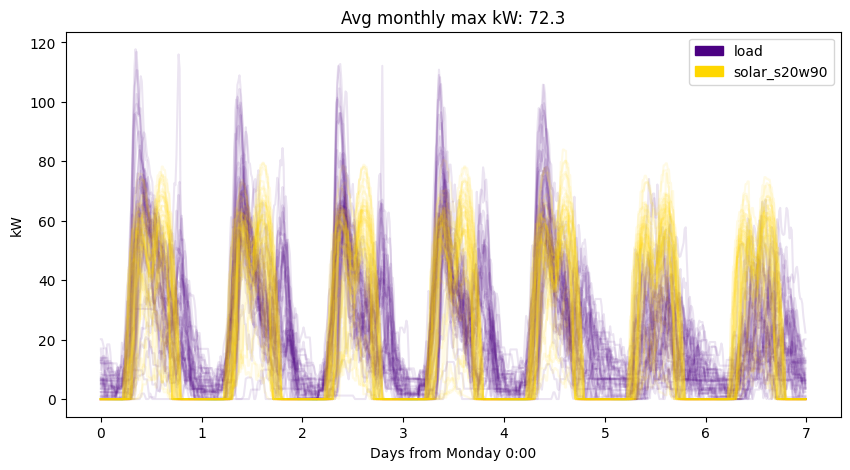

In [13]:
l = df['load']
s = df['solar_s20w90']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly((l,s),f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

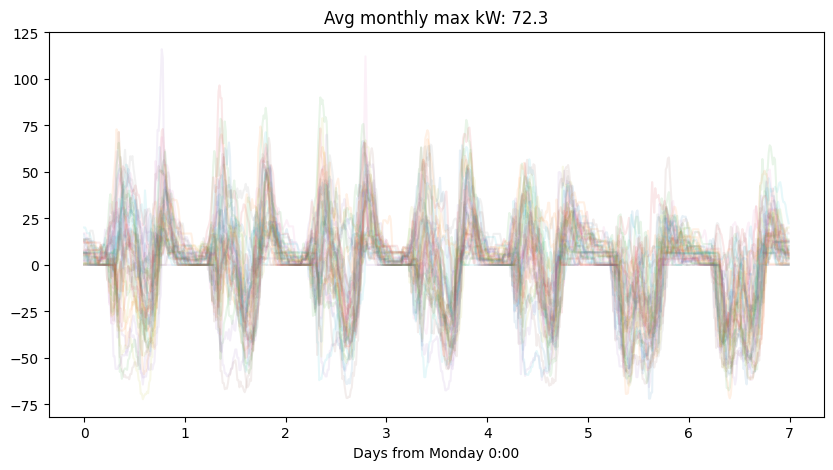

In [14]:
l = df['load']
s = df['solar_s20w90']
avg_monthly_max = (l - s).resample('1M').max().mean()  
plot_weekly(l-s,f'Avg monthly max kW: {avg_monthly_max:.1f}',ylabel='kW')

# Baseline costs

Load only, and net load given various solar

In [15]:
real_TOU = [  {'price':26.07, 'hours':list(range(24)) },
              {'price': 6.81, 'hours':list(range(14,16))+list(range(21,23))},
              {'price':32.90, 'hours':list(range(16,21))}]

In [16]:
all_cost = {}

# # load
# cost = 0
# for year in df.index.year.unique():
#     df_year = df[df.index.year==year]
#     for month in df_year.index.month.unique():
#         df_month = df_year[df_year.index.month==month]
#         cost += calc_power_cost(df_month['load'],real_TOU)
# all_cost['load'] = round(cost,0)

# # net load for each solar case

load_cols = ['load'] + [f'netload_{angle}' for angle in solar_angles]

for load_col in load_cols:
    cost = 0
    for year in df.index.year.unique():
        df_year = df[df.index.year==year]
        for month in df_year.index.month.unique():
            df_month = df_year[df_year.index.month==month]
            cost += calc_power_cost(df_month[load_col],real_TOU)
    all_cost[load_col] = round(cost,0)

all_cost

{'load': 50421.0,
 'netload_s20': 40554.0,
 'netload_w90': 40918.0,
 'netload_s20w90': 40609.0}

# Monthly peaks

## Single TOU

In [17]:
df

,load,solar_s20,solar_w90,solar_s20w90,netload_s20,netload_w90,netload_s20w90
Datetime (PST),,,,,,,
2018-04-25 03:00:00,0.000000,-0.008155,-0.008155,-0.008155,0.008155,0.008155,0.008155
2018-04-25 03:15:00,1.668640,-0.008155,-0.008155,-0.008155,1.676795,1.676795,1.676795
2018-04-25 03:30:00,3.575657,-0.008155,-0.008155,-0.008155,3.583812,3.583812,3.583812
2018-04-25 03:45:00,3.575657,-0.008155,-0.008155,-0.008155,3.583812,3.583812,3.583812
2018-04-25 04:00:00,3.575657,-0.008155,-0.008155,-0.008155,3.583812,3.583812,3.583812
...,...,...,...,...,...,...,...
2019-03-23 15:30:00,3.509377,17.995300,17.280600,17.588300,-14.485923,-13.771223,-14.078923
2019-03-23 15:45:00,3.509377,17.995300,17.280600,17.588300,-14.485923,-13.771223,-14.078923
2019-03-23 16:00:00,3.509377,13.553100,12.408300,12.943800,-10.043723,-8.898923,-9.434423


In [18]:
peak_begin,peak_end = 8,11
angle = 's20'
peaks = calc_monthly_peaks(df[f'netload_{angle}'],peak_begin,peak_end)
peaks

,netload_s20 kw,netload_s20 t
0,56.8,2018-05-22 09:15:00
1,44.8,2018-06-06 08:15:00
2,68.4,2018-07-06 10:00:00
3,57.3,2018-08-20 08:00:00
4,77.9,2018-09-05 08:45:00
5,95.9,2018-10-09 08:15:00
6,63.0,2018-11-29 10:00:00
7,72.2,2018-12-06 09:45:00
8,64.0,2019-01-17 10:30:00
9,67.2,2019-02-14 09:45:00


In [19]:
peak_begin,peak_end = 8,11
angle = 's20'
peaks = calc_monthly_peaks(df[f'netload_{angle}'],peak_begin,peak_end)

# angle = 'w20'
# peaks = pd.concat((peaks,calc_monthly_peaks(df[f'netload_{angle}'],peak_begin,peak_end)),axis=1)
# peaks[f'netload_s20->{angle} reduc kw'] = peaks['netload_s20 kw'] - peaks[f'netload_{angle} kw']

angle = 'w90'
peaks = pd.concat((peaks,calc_monthly_peaks(df[f'netload_{angle}'],peak_begin,peak_end)),axis=1)
peaks[f'netload_s20->{angle} reduc kw'] = peaks['netload_s20 kw'] - peaks[f'netload_{angle} kw']

angle = 's20w90'
peaks = pd.concat((peaks,calc_monthly_peaks(df[f'netload_{angle}'],peak_begin,peak_end)),axis=1)
peaks[f'netload_s20->{angle} reduc kw'] = peaks['netload_s20 kw'] - peaks[f'netload_{angle} kw']

#print('Avg w20 reduction',peaks['netload_s20->w20 reduc kw'].mean())
print('Avg w90 reduction',peaks['netload_s20->w90 reduc kw'].mean())
print('Avg s20w90 reduction',peaks['netload_s20->s20w90 reduc kw'].mean())
peaks

Avg w90 reduction -0.23999999999999916
Avg s20w90 reduction 0.4000000000000014


,netload_s20 kw,netload_s20 t,netload_w90 kw,netload_w90 t,netload_s20->w90 reduc kw,netload_s20w90 kw,netload_s20w90 t,netload_s20->s20w90 reduc kw
0,56.8,2018-05-22 09:15:00,59.3,2018-05-22 09:15:00,-2.5,58.1,2018-05-22 09:15:00,-1.3
1,44.8,2018-06-06 08:15:00,47.5,2018-06-06 08:15:00,-2.7,46.2,2018-06-06 08:15:00,-1.4
2,68.4,2018-07-06 10:00:00,47.7,2018-07-23 10:30:00,20.7,56.8,2018-07-06 10:00:00,11.6
3,57.3,2018-08-20 08:00:00,59.3,2018-08-27 08:45:00,-2.0,58.2,2018-08-20 08:00:00,-0.9
4,77.9,2018-09-05 08:45:00,80.0,2018-09-05 08:45:00,-2.1,79.0,2018-09-05 08:45:00,-1.1
5,95.9,2018-10-09 08:15:00,97.2,2018-10-09 08:15:00,-1.3,96.5,2018-10-09 08:15:00,-0.6
6,63.0,2018-11-29 10:00:00,72.8,2018-11-28 10:30:00,-9.8,63.9,2018-11-29 10:00:00,-0.9
7,72.2,2018-12-06 09:45:00,72.7,2018-12-06 09:45:00,-0.5,72.5,2018-12-06 09:45:00,-0.3
8,64.0,2019-01-17 10:30:00,65.4,2019-01-17 10:30:00,-1.4,64.7,2019-01-17 10:30:00,-0.7
9,67.2,2019-02-14 09:45:00,68.0,2019-02-14 09:45:00,-0.8,67.6,2019-02-14 09:45:00,-0.4


## Variable TOU

w20

In [20]:
# angle1 = 's20'
# angle2 = 'w20'

# peak_reduc_v_TOU = net_load_peak_reduction_variable_TOU(df,angle1,angle2)
# peak_reduc_v_TOU[peak_reduc_v_TOU['avg peak reduction [kW]']>0.1]

w90

In [21]:
angle1 = 's20'
angle2 = 'w90'

peak_reduc_v_TOU = net_load_peak_reduction_variable_TOU(df,angle1,angle2)
peak_reduc_v_TOU[peak_reduc_v_TOU['avg peak reduction [kW]']>5]

,TOU begin [h],TOU end [h],max peak reduction [kW],avg peak reduction [kW],min peak reduction [kW]
64,15,18,28.2,5.7,-1.2
68,16,18,28.2,6.0,-1.2


s20w90

In [22]:
angle1 = 's20'
angle2 = 's20w90'

peak_reduc_v_TOU = net_load_peak_reduction_variable_TOU(df,angle1,angle2)
peak_reduc_v_TOU[peak_reduc_v_TOU['avg peak reduction [kW]']>5]

,TOU begin [h],TOU end [h],max peak reduction [kW],avg peak reduction [kW],min peak reduction [kW]


Best for w90

In [ ]:
#df.loc['2022-6-28':'2022-6-30'][['load','solar_s20','solar_w90','solar_s20w90']].plot()

In [ ]:
#df.loc['2022-3-5':'2022-3-7'][['load','solar_s20','solar_w90','solar_s20w90']].plot()

Largest spread w90 v s20w90

In [ ]:
#df.loc['2022-10-12':'2022-10-14'][['load','solar_s20','solar_w90','solar_s20w90']].plot()

# Peak shaving

In [24]:
angle = 's20'
thresholds = (21.563, 21.563, 0.0)#(21.563, 21.563, 0.0)

batt_kwh = 100
TOU = [{'price':26.07, 'hours':list(range(24)) },
       {'price':6.81,  'hours':list(range(14,16))+list(range(18,23))},
       {'price':32.90, 'hours':list(range(16,18))}]
fail,dispatch = peak_shaving_sim(  df[['load',f'solar_{angle}',f'netload_{angle}']]\
                                   .loc['2018-6'],
                                   f'netload_{angle}',
                                   batt_kwh,
                                   thresholds,
                                   TOU,
                                   utility_chg_max=batt_kwh,)

cost = calc_power_cost(dispatch.utility,TOU)

plotly_stacked( dispatch.drop(columns=['soc']),
                solar=f'solar_{angle}',
                threshold0=thresholds[0], threshold0_h=TOU[0]['hours'],                     
                threshold1=thresholds[1], threshold1_h=TOU[1]['hours'],
                threshold2=thresholds[2], threshold2_h=TOU[2]['hours'],                                
                title=f'Cost {cost:.1f} ' + {True:'- Failure',False:''}[fail],
                size=(800,400),
                #upsample_min=1,
                )

In [25]:
angle = 'w90'
thresholds = (13.03, 19.371, 0.0)

batt_kwh = 100
TOU = [{'price':26.07, 'hours':list(range(24)) },
       {'price':6.81,  'hours':list(range(14,16))+list(range(18,23))},
       {'price':32.90, 'hours':list(range(16,18))}]
fail,dispatch = peak_shaving_sim(  df[['load',f'solar_{angle}',f'netload_{angle}']]\
                                   .loc['2018-6'],
                                   f'netload_{angle}',
                                   batt_kwh,
                                   thresholds,
                                   TOU,
                                   utility_chg_max=batt_kwh,)

cost = calc_power_cost(dispatch.utility,TOU)

plotly_stacked( dispatch.drop(columns=['soc']),
                solar=f'solar_{angle}',
                threshold0=thresholds[0], threshold0_h=TOU[0]['hours'],                     
                threshold1=thresholds[1], threshold1_h=TOU[1]['hours'],
                threshold2=thresholds[2], threshold2_h=TOU[2]['hours'],                                
                title=f'Cost {cost:.1f} ' + {True:'- Failure',False:''}[fail],
                size=(800,400),
                #upsample_min=1,
                )

## Minimize cost

Grid search rough, fine, and gradient descent

In [40]:
TEST = False

TOU = [{'price':26.07,      'hours':list(range(24)) },
       {'price': 6.81,      'hours':list(range(14,16))+list(range(18,23))},
       {'price':32.90,      'hours':list(range(16,18))}]

batt_kwhs = [25,50,75,100,125,150]
angles = ['s20','w90','s20w90']
year_months = [f'{y}-{m}' for y in df.index.year.unique() for m in df.loc[str(y)].index.month.unique()]

if TEST == True: angles, batt_kwhs, year_months = angles[:1], batt_kwhs[:1], year_months[:1]

rough_search_max = 100
rough_step = 10

tic = pd.Timestamp.now()

output = pd.DataFrame([],columns=['angle','batt kwh','total cost']+year_months)
for batt_kwh in batt_kwhs:
    for angle in angles:
        best_monthly = pd.DataFrame([],columns=['year-month','threshold0','threshold1','threshold2','cost'])
        for year_month in year_months:
            _df = df.loc[year_month][['load',f'solar_{angle}',f'netload_{angle}']]
            t_newmonth = pd.Timestamp.now()
            print(f'\n{t_newmonth} Angle {angle} batt_kwh {batt_kwh } begin new month {year_month}')
            
            r = pd.DataFrame([], columns=['i','fail','th0','th1','th2','c','deltac','dc'])
            
            #
            # Rough grid search
            #
            
            k = 0
            for th0 in range(0,rough_search_max,rough_step):
                for th1 in range(0,rough_search_max,rough_step):
                    th1 = min(th0,th1)
                    for th2 in range(0,rough_search_max,rough_step):
                        k += 1
                        fail,dispatch = peak_shaving_sim(   _df,
                                                            f'netload_{angle}',
                                                            batt_kwh,
                                                            [th0,th1,th2],
                                                            TOU,
                                                            utility_chg_max=batt_kwh,)                
                        #if fail == False:
                        cost = calc_power_cost(dispatch.utility,TOU)
                        r.loc[len(r)] = [k,fail,th0,th1,th2,cost,pd.NA,pd.NA]
            
            if len(r) > 0:
                best_cost = r[r.fail==False]['c'].min()
                imin = r[r.fail==False]['c'].idxmin()
                best_th0 = r.loc[imin].th0
                best_th1 = r.loc[imin].th1
                best_th2 = r.loc[imin].th2
            else: 
                print(f'\n\n\n /// No viable solutions for angle {angle} batt_kwh {batt_kwh} year-month {year_month} rough_search_max {rough_search_max}/// \n\n\n')
                break
            
            t_rgs = pd.Timestamp.now()
            dt = (t_rgs - t_newmonth).seconds
            print(f'{t_rgs} (+{dt}s) Rough grid search done for {year_month} thresholds=({best_th0:.1f},{best_th1:.1f},{best_th2:.1f}), cost={best_cost:.1f} ')


            #
            # Fine grid search
            #

            for th0 in range(max(0,int(best_th0-rough_step)),int(best_th0+rough_step+1),3):
                for th1 in range(max(0,int(best_th1-rough_step)),int(best_th1+rough_step+1),3):
                    th1 = min(th0,th1)
                    for th2 in range(max(0,int(best_th2-rough_step)),int(best_th2+rough_step)):                        
                        k += 1
                        fail,dispatch = peak_shaving_sim(   _df,
                                                            f'netload_{angle}',
                                                            batt_kwh,
                                                            [th0,th1,th2],
                                                            TOU,
                                                            utility_chg_max=batt_kwh,)                
                        #if fail == False:
                        cost = calc_power_cost(dispatch.utility,TOU)
                        r.loc[len(r)] = [k,fail,th0,th1,th2,cost,pd.NA,pd.NA]
            
            best_cost = r[r.fail==False]['c'].min()
            imin = r[r.fail==False]['c'].idxmin()
            best_th0 = r.loc[imin].th0
            best_th1 = r.loc[imin].th1
            best_th2 = r.loc[imin].th2
            
            t_fgs = pd.Timestamp.now()
            dt = (t_fgs - t_rgs).seconds
            print(f'{t_fgs} (+{dt}s) Fine grid search done for {year_month} thresholds=({best_th0:.1f},{best_th1:.1f},{best_th2:.1f}), cost={best_cost:.1f} ')
            
            #
            # Gradient descent
            #                

            LR = (0.1,0.1,0.1)
            
            c = []
            th = [[best_th0,best_th1,best_th2]]
            cost,fail,dispatch = f(th[0],_df,angle,batt_kwh,TOU)
            c.append(cost)
            
            #final_countdown = 20
            cmin = cost
            patience_counter = 0
            for i in range(1,500):
                dc = grad_f(th[i-1],_df,angle,batt_kwh,TOU)                     # dy
                dth = [(dx+nz)*lr for dx,lr,nz in zip(dc,LR,np.random.rand(3))] # dx
                new_th = [max(0,x+dx) for x,dx in zip(th[i-1],dth)]             # x2 = x1 + dx
                new_th[1] = min(new_th[0],new_th[1])                            # all th1 <= th0
                new_th[2] = min(new_th[0],new_th[2])                            # all th2 <= th1
                th.append(new_th)
                cost,fail,dispatch = f(th[i],_df,angle,batt_kwh,TOU)                  
                c.append(cost)
                
                r.loc[len(r)] = [i+k, # k from rough/fine searches
                                fail,
                                round(th[i][0],3),
                                round(th[i][1],3),
                                round(th[i][2],3),
                                c[i],
                                c[i]-c[i-1],
                                [round(x,3) for x in dc]]
                
                if cost < cmin:
                    cmin = cost
                    patience_counter = 0
                else:
                    patience_counter += 1
                    
                # stopping condition
                if patience_counter >= 50:
                    break

                # stopping conditions
                # if r[['deltac']][k:].dropna().rolling(100).std().iloc[-1,0] > 10:
                #     break
                
                # deltac = r[['deltac']].rolling(100).mean()[k:].dropna()
                # if len(deltac[deltac.deltac > -0.1]) >= 50:
                #     break
                
                # if abs(c[i]-c[i-1])<0.3:
                #     final_countdown -= 1
                    
                # if final_countdown == 0:
                #     break
                                
                
            #
            # Gradient descent small LR
            #                
            
            # LR = (0.01,0.01,0.01)
            
            # print(f'{pd.Timestamp.now()} Gradient descent decrease LR to {LR} for {year_month} thresholds=({best_th0:.1f},{best_th1:.1f},{best_th2:.1f}), cost={best_cost:.1f} ')
            
            # j = i
            # for i in range(j,j+500):
            #     dc = grad_f(th[i-1])
            #     dth = [(dx+nz)*lr for dx,lr,nz in zip(dc,LR,rnd.rand(3))]
            #     new_th = [max(0,x+dx) for x,dx in zip(th[i-1],dth)]
            #     th.append(new_th)
            #     cost,fail,dispatch = f(th[i])                    
            #     c.append(cost)
                
            #     r.loc[len(r)] = [i+k,
            #                      fail,
            #                      round(th[i][0],3),
            #                      round(th[i][1],3),
            #                      round(th[i][2],3),
            #                      c[i],
            #                      c[i]-c[i-1],
            #                      [round(x,3) for x in dc]]


            best_cost   = r[r.fail==False]['c'].min()
            imin        = r[r.fail==False]['c'].idxmin()
            best_th0    = r.loc[imin].th0
            best_th1    = r.loc[imin].th1
            best_th2    = r.loc[imin].th2
            best_monthly.loc[len(best_monthly)] = [year_month,  best_th0,
                                                                best_th1,
                                                                best_th2,   best_cost]
        
        
            t_gd = pd.Timestamp.now()
            dt = (t_gd - t_fgs).seconds
            print(f'{t_gd} (+{dt}s) Gradient descent done for {year_month} thresholds=({best_th0:.1f},{best_th1:.1f},{best_th2:.1f}), cost={best_cost:.1f} ')
    
        #best_monthly.index = best_monthly.month
        #best_monthly = best_monthly.drop(columns=['month'])
        
        # print('/// Best monthly')
        # print(f'Batt kwh {batt_kwh}')
        # print(f'Total cost {best_monthly.cost.sum():.1f}')
        # print(best_monthly.T,'\n\n')
        
        
        new_row = [angle, batt_kwh, best_monthly.cost.sum()]
        for th0,th1,th2 in zip(best_monthly.threshold0,best_monthly.threshold1,best_monthly.threshold2):
            new_row.append( (th0,th1,th2) )
        output.loc[len(output)] = new_row
        output.to_csv(output_filename_stub+tic.strftime('%y-%m-%d_%H-%M-%S')+'.csv')
        
# r.loc[r.fail==False,'c'] = r[r.fail==False].c
# r.loc[r.fail==True,'c (fail)'] = r[r.fail==True].c
# r[['c','c (fail)']].plot()
print('Elapsed',pd.Timestamp.now()-tic)


2023-10-24 23:10:08.895349 Angle s20 batt_kwh 25 begin new month 2018-5
2023-10-24 23:10:22.937823 (+14s) Rough grid search done for 2018-5 thresholds=(40.0,40.0,10.0), cost=1644.2 
2023-10-24 23:10:37.907653 (+14s) Fine grid search done for 2018-5 thresholds=(40.0,40.0,10.0), cost=1644.2 
2023-10-24 23:10:49.862573 (+11s) Gradient descent done for 2018-5 thresholds=(40.0,41.4,9.3), cost=1619.3 

2023-10-24 23:10:49.863570 Angle s20 batt_kwh 25 begin new month 2018-6
2023-10-24 23:11:03.439141 (+13s) Rough grid search done for 2018-6 thresholds=(50.0,50.0,10.0), cost=1973.0 
2023-10-24 23:11:18.165623 (+14s) Fine grid search done for 2018-6 thresholds=(46.0,46.0,4.0), cost=1644.1 
2023-10-24 23:11:26.206047 (+8s) Gradient descent done for 2018-6 thresholds=(45.8,45.8,3.4), cost=1619.9 

2023-10-24 23:11:26.207045 Angle s20 batt_kwh 25 begin new month 2018-7
2023-10-24 23:11:39.822509 (+13s) Rough grid search done for 2018-7 thresholds=(60.0,60.0,30.0), cost=2959.8 
2023-10-24 23:11:55

## Reload results


Large batt sizes

In [78]:
output = pd.read_csv(output_filename_stub+'23-10-24_21-41-03.csv',
                     index_col=0)

output

,angle,batt kwh,total cost,2018-5,2018-6,2018-7,2018-8,2018-9,2018-10,2018-11,2018-12,2019-1,2019-2
0,s20,100,12205.929820,"(28.645, 32.354, 0.0)","(21.589, 23.306, 0.024)","(40.145, 42.405, 0.0)","(37.299, 39.509, 0.045)","(51.899, 52.984, 6.955)","(57.05, 81.499, 26.741)","(20.877, 26.292, 0.0)","(27.214, 35.13, 0.0)","(31.76, 34.006, 0.0)","(20.962, 23.682, 0.0)"
1,w90,100,10398.178274,"(29.0, 26.0, 0.0)","(13.035, 17.955, 0.009)","(26.342, 28.965, 0.013)","(23.393, 31.818, 0.0)","(37.86, 41.534, 0.0)","(65.701, 67.268, 1.465)","(32.0, 20.0, 0.0)","(32.453, 37.064, 0.0)","(33.873, 40.223, 0.0)","(24.209, 26.254, 0.0)"
2,s20w90,100,10671.682315,"(27.956, 29.596, 0.0)","(14.438, 16.813, 0.0)","(30.823, 34.037, 0.0)","(25.702, 27.948, 0.022)","(42.971, 47.502, 1.517)","(59.355, 63.665, 13.798)","(26.0, 16.0, 0.0)","(29.803, 32.424, 0.0)","(32.818, 38.553, 0.0)","(21.402, 26.267, 0.021)"
3,s20,200,5915.416033,"(21.915, 26.965, 0.0)","(6.981, 9.721, 0.0)","(16.59, 22.122, 0.0)","(15.163, 18.143, 0.007)","(24.037, 33.185, 0.0)","(35.306, 40.321, 0.0)","(11.098, 17.418, 0.0)","(16.226, 21.964, 0.0)","(21.532, 23.11, 0.0)","(11.054, 13.511, 0.0)"
4,w90,200,6469.073890,"(21.614, 27.321, 0.0)","(9.173, 10.113, 0.0)","(15.891, 20.617, 0.009)","(15.887, 21.193, 0.0)","(26.218, 31.315, 0.0)","(34.06, 38.019, 0.0)","(16.025, 20.24, 0.0)","(20.437, 26.764, 0.0)","(23.218, 26.228, 0.0)","(14.217, 16.636, 0.0)"
5,s20w90,200,5846.078466,"(21.752, 23.012, 0.0)","(5.809, 8.303, 0.001)","(15.27, 15.954, 0.0)","(12.725, 13.043, 0.0)","(22.688, 25.021, 0.011)","(34.566, 36.147, 0.035)","(13.0, 13.0, 0.0)","(17.879, 21.845, 0.0)","(22.357, 23.323, 0.0)","(11.708, 15.717, 0.0)"
6,s20,400,3987.593341,"(16.769, 24.04, 0.0)","(2.263, 3.069, 0.0)","(12.405, 19.764, 0.093)","(11.197, 13.007, 0.0)","(15.887, 19.016, 0.067)","(26.962, 29.697, 0.0)","(3.775, 9.921, 0.0)","(10.571, 15.213, 0.0)","(14.802, 26.429, 0.0)","(6.486, 12.868, 0.0)"
7,w90,400,4486.575664,"(17.158, 20.819, 0.0)","(4.301, 5.998, 0.0)","(13.324, 21.005, 0.0)","(10.685, 26.296, 0.0)","(17.442, 19.019, 0.0)","(27.969, 33.535, 0.0)","(8.525, 8.98, 0.0)","(12.058, 17.639, 0.0)","(16.417, 21.595, 0.0)","(8.573, 21.374, 0.0)"
8,s20w90,400,4142.466967,"(16.898, 19.075, 0.0)","(2.486, 3.051, 0.0)","(12.437, 23.751, 0.0)","(10.602, 13.164, 0.049)","(16.079, 22.095, 0.0)","(27.447, 28.9, 0.0)","(5.623, 6.818, 0.0)","(11.304, 13.598, 0.093)","(15.65, 21.306, 0.0)","(7.32, 10.125, 0.0)"
9,s20,600,3009.984642,"(14.206, 16.003, 0.0)","(1.455, 3.05, 0.0)","(9.643, 17.818, 0.0)","(9.477, 10.12, 0.0)","(13.173, 16.293, 0.0)","(21.703, 26.738, 0.05)","(0.0, 0.0, 0.0)","(5.793, 6.002, 0.0)","(12.314, 18.089, 0.0)","(3.632, 6.141, 0.098)"


In [50]:
output = output[['angle','batt kwh','total cost']]

batt_sizes = output['batt kwh'].unique()

outS20 = output[output.angle=='s20']
outW90 = output[output.angle=='w90']
outS20W90 = output[output.angle=='s20w90']

results = pd.DataFrame([],index=batt_sizes)

results['s20'] = outS20['total cost'].values.round(0)
results['w90'] = outW90['total cost'].values.round(0)
results['s20w90'] = outS20W90['total cost'].values.round(0)

results['s20->w90 reduction'] = (results.s20 - results.w90)/results.s20
results['s20->w20w90 reduction'] = (results.s20 - results.s20w90)/results.s20

results_large = results.iloc[1:,:].copy()

results_large

,s20,w90,s20w90,s20->w90 reduction,s20->w20w90 reduction
200,5915.0,6469.0,5846.0,-0.093660,0.011665
400,3988.0,4487.0,4142.0,-0.125125,-0.038616
600,3010.0,3534.0,3166.0,-0.174086,-0.051827
800,2334.0,2892.0,2494.0,-0.239075,-0.068552


Small batt sizes

In [51]:
output = pd.read_csv(output_filename_stub+'23-10-24_23-10-08.csv',
                     index_col=0)

output

,angle,batt kwh,total cost,2018-5,2018-6,2018-7,2018-8,2018-9,2018-10,2018-11,2018-12,2019-1,2019-2
0,s20,25,24720.062737,"(39.987, 41.42, 9.257)","(45.83, 45.83, 3.435)","(56.548, 60.614, 22.467)","(60.67, 71.89, 19.939)","(61.037, 67.237, 46.294)","(79.785, 82.26, 82.283)","(46.0, 35.0, 15.0)","(53.0, 29.0, 15.0)","(46.0, 35.0, 12.0)","(46.439, 49.598, 17.725)"
1,w90,25,22194.431164,"(41.829, 44.242, 4.514)","(37.031, 39.376, 0.026)","(46.624, 54.15, 17.637)","(80.0, 80.0, 0.0)","(65.356, 69.754, 23.098)","(79.779, 81.099, 81.155)","(53.0, 35.0, 12.0)","(53.0, 29.0, 12.0)","(49.0, 39.0, 12.0)","(49.0, 36.0, 18.0)"
2,s20w90,25,22718.779239,"(40.856, 54.879, 4.549)","(37.947, 41.119, 0.0)","(48.926, 50.217, 19.951)","(79.888, 80.122, 2.65)","(60.049, 61.554, 35.872)","(79.785, 82.237, 82.238)","(46.0, 35.0, 13.0)","(53.0, 29.0, 14.0)","(46.489, 53.709, 11.218)","(49.0, 36.0, 18.0)"
3,s20,50,18375.492167,"(34.826, 38.564, 0.0)","(35.313, 38.549, 0.055)","(52.11, 56.95, 10.948)","(49.21, 53.366, 8.696)","(59.162, 68.878, 26.634)","(65.303, 68.135, 58.447)","(32.996, 35.322, 1.959)","(42.0, 29.0, 4.0)","(38.315, 40.725, 0.0)","(36.671, 43.32, 6.409)"
4,w90,50,16033.853966,"(36.898, 39.223, 0.038)","(27.279, 30.101, 0.074)","(37.24, 48.567, 7.216)","(38.166, 42.686, 0.035)","(55.98, 58.438, 6.661)","(74.66, 77.438, 39.295)","(43.0, 26.0, 0.0)","(42.0, 30.0, 0.0)","(40.832, 47.117, 0.0)","(37.487, 43.211, 6.757)"
5,s20w90,50,16543.797168,"(36.0, 33.0, 0.0)","(29.461, 30.052, 0.0)","(43.532, 49.376, 8.728)","(39.195, 40.717, 0.0)","(61.359, 69.792, 11.796)","(98.109, 98.558, 19.838)","(36.0, 29.0, 0.0)","(40.0, 30.0, 0.0)","(39.597, 43.644, 0.0)","(37.084, 49.352, 6.572)"
6,s20,75,14601.088835,"(30.746, 34.62, 0.0)","(28.22, 31.578, 0.0)","(47.921, 49.175, 0.0)","(45.45, 50.06, 0.103)","(59.47, 61.328, 11.995)","(60.074, 61.146, 39.842)","(26.767, 30.343, 0.0)","(30.416, 33.33, 0.0)","(34.839, 42.113, 0.0)","(28.197, 29.21, 0.0)"
7,w90,75,12692.271639,"(33.0, 26.0, 0.0)","(19.591, 21.836, 0.001)","(32.552, 36.748, 0.021)","(30.241, 33.519, 0.017)","(47.376, 50.582, 0.096)","(84.804, 88.359, 4.994)","(36.0, 19.0, 0.0)","(35.701, 41.109, 0.0)","(37.294, 41.188, 0.0)","(29.297, 35.37, 0.0)"
8,s20w90,75,13157.441650,"(33.0, 26.0, 0.0)","(21.598, 26.981, 0.012)","(38.345, 39.152, 0.0)","(32.042, 35.596, 0.019)","(56.0, 56.0, 0.0)","(78.989, 87.429, 15.876)","(30.0, 20.0, 0.0)","(33.064, 39.504, 0.0)","(36.085, 39.299, 0.0)","(28.63, 30.156, 0.016)"
9,s20,100,12231.840840,"(28.648, 32.001, 0.003)","(21.577, 24.474, 0.0)","(40.143, 41.744, 0.0)","(37.282, 41.45, 0.094)","(51.349, 61.764, 7.431)","(59.406, 62.379, 25.161)","(20.88, 23.158, 0.0)","(27.178, 33.274, 0.0)","(31.762, 37.837, 0.0)","(21.081, 22.911, 0.0)"


In [52]:
output = output[['angle','batt kwh','total cost']]

batt_sizes = output['batt kwh'].unique()

outS20 = output[output.angle=='s20']
outW90 = output[output.angle=='w90']
outS20W90 = output[output.angle=='s20w90']

results = pd.DataFrame([],index=batt_sizes)

results['s20'] = outS20['total cost'].values.round(0)
results['w90'] = outW90['total cost'].values.round(0)
results['s20w90'] = outS20W90['total cost'].values.round(0)

results['s20->w90 reduction'] = (results.s20 - results.w90)/results.s20
results['s20->w20w90 reduction'] = (results.s20 - results.s20w90)/results.s20

results_small = results.copy()

results_small

,s20,w90,s20w90,s20->w90 reduction,s20->w20w90 reduction
25,24720.0,22194.0,22719.0,0.102184,0.080947
50,18375.0,16034.0,16544.0,0.127401,0.099646
75,14601.0,12692.0,13157.0,0.130744,0.098897
100,12232.0,10400.0,10671.0,0.149771,0.127616
125,9979.0,8681.0,8716.0,0.130073,0.126566
150,8151.0,7724.0,7078.0,0.052386,0.131640


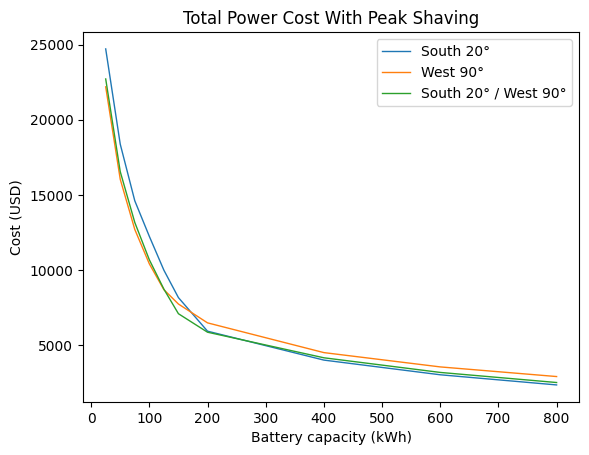

In [73]:
pd.options.plotting.backend='matplotlib'
results = pd.concat((results_small,results_large)).iloc[:,:3]
results.columns = ['South 20°','West 90°','South 20° / West 90°']
results.plot(title='Total Power Cost With Peak Shaving',
             xlabel='Battery capacity (kWh)',
             ylabel='Cost (USD)',
             linewidth=1);

# Etc

In [ ]:
r[['deltac']][k:].dropna().rolling(100).std().plot()

In [ ]:
r[r.fail==False].loc[k+1:].plot.scatter(x='th0',y='c',color='i',width=800,height=400)

In [ ]:
r[r.fail==False].loc[k+1:].plot.scatter(x='th1',y='c',color='i',width=800,height=400)

In [ ]:
r[r.fail==False].loc[k+1:].plot.scatter(x='th2',y='c',color='i',width=800,height=400)

In [ ]:
r.loc[k+1:][['th0','th1','c']].plot.scatter(x='th0',y='th1',color='c')

In [ ]:
r.loc[k+1:][['th0','th2','c']].plot.scatter(x='th0',y='th2',color='c')

# CF Shape

In [ ]:
import numpy as np

TH0 = np.empty((500,3))
TH0

array([[6.95171738e-310, 6.95171738e-310, 4.68937172e-310],
       [4.68937172e-310, 4.94065646e-324, 4.68937172e-310],
       [4.94065646e-324, 4.68937172e-310, 6.95165821e-310],
       ...,
       [6.95171692e-310, 6.95163184e-310, 6.95171692e-310],
       [6.95163184e-310, 6.95171692e-310, 6.95163184e-310],
       [6.95171692e-310, 6.95163180e-310, 6.95171692e-310]])

In [ ]:
import numpy as np

def shuffle_along_axis(a, axis=0):
    idx = np.random.rand(*a.shape).argsort(axis=axis)
    return np.take_along_axis(a,idx,axis=axis)


th012_values = np.empty((50**3,3))

i = 0
for th0 in [x for x in range(50)]:
    for th1 in [x for x in range(50)]:
        for th2 in [x for x in range(50)]:
            th012_values[i,0] = th0
            th012_values[i,1] = th1
            th012_values[i,2] = th2
            i += 1
            
th012_values = shuffle_along_axis(th012_values)

TH0 =  np.empty(50**3)
TH1 =  np.empty(50**3)
TH2 =  np.empty(50**3)
C =    np.empty(50**3)
FAIL = np.empty(50**3)

angle = 's20'
_df = df.loc[year_month][['load',f'solar_{angle}',f'netload_{angle}']].copy(deep=True)

for i in range(len(th012_values)):
    th0 = th012_values[i,0]
    th1 = th012_values[i,1]
    th2 = th012_values[i,2]

    if (th0>=th1) and (th0>=th2):
        fail,dispatch = peak_shaving_sim(   _df,
                                            f'netload_{angle}',
                                            100,
                                            [th0,th1,th2],
                                            TOU,
                                            utility_chg_max=100,)                
        cost = calc_power_cost(dispatch.utility,TOU)
        TH0[i] = th0
        TH1[i] = th1
        TH2[i] = th2
        C[i] = cost
        FAIL[i] = fail
        #print(i,th0,th1,th2,cost,fail)
    else:
        TH0[i] = th0
        TH1[i] = th1
        TH2[i] = th2
        C[i] = np.nan
        FAIL[i] = np.nan
        #print(i,th0,th1,th2,np.nan,np.nan)

In [ ]:
pd.DataFrame({'th0':TH0,'th1':TH1,'th2':TH2,'c':C,'fail':FAIL}).to_csv('CFshape.csv')

In [ ]:
import plotly.express as px

r = pd.DataFrame({'th0':TH0,'th1':TH1,'th2':TH2,'c':C,'fail':FAIL})

fig = px.scatter_3d(r, x='th0', y='th1', z='c',
              color='c')
fig.show()

In [ ]:
import plotly.express as px

r = pd.DataFrame({'th0':TH0,'th1':TH1,'th2':TH2,'c':C,'fail':FAIL})

fig = px.scatter_3d(r[r.th2==0], x='th0', y='th1', z='c',
              color='c')
fig.show()

In [ ]:
import plotly.graph_objects as go
import pandas as pd
import numpy as np
from scipy.interpolate import griddata


#df = pd.read_csv('./test_data.csv')

rth01 = r[r.th2==0]

x = np.array(rth01.th0)
y = np.array(rth01.th1)
z = np.array(rth01.c)


xi = np.linspace(x.min(), x.max(), 100)
yi = np.linspace(y.min(), y.max(), 100)

X,Y = np.meshgrid(xi,yi)

Z = griddata((x,y),z,(X,Y), method='cubic')

fig = go.Figure(go.Surface(x=xi,y=yi,z=Z))
fig.show()

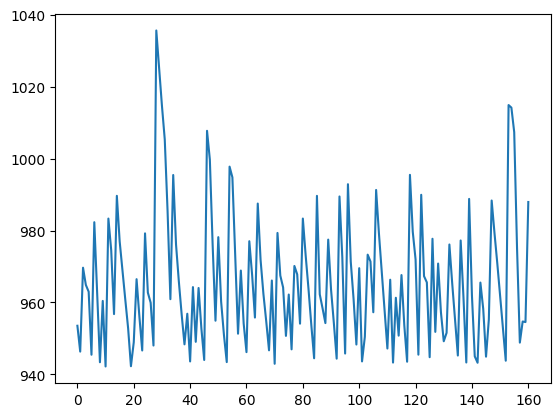

In [ ]:
plt.plot(c)

In [ ]:
r = pd.read_csv('CFshape.csv',index_col=0)
r = r[r.th2==0]
r = r.sort_values(['th0','th1'])
#r = r.sort_values('th1')
r.head(25)

,th0,th1,th2,c,fail
108640,0.0,0.0,0.0,2539.724706,1.0
82092,0.0,2.0,0.0,NaN,NaN
102988,0.0,2.0,0.0,NaN,NaN
82222,0.0,3.0,0.0,NaN,NaN
109015,0.0,3.0,0.0,NaN,NaN
74508,0.0,5.0,0.0,NaN,NaN
116422,0.0,5.0,0.0,NaN,NaN
49728,0.0,7.0,0.0,NaN,NaN
39407,0.0,8.0,0.0,NaN,NaN
85,0.0,9.0,0.0,NaN,NaN


MemoryError: Unable to allocate 4.55 TiB for an array with shape (250000000, 2500) and data type float64

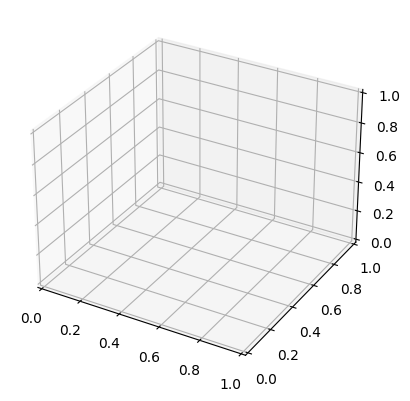

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

from matplotlib import cm
from matplotlib.ticker import LinearLocator

fig, ax = plt.subplots(subplot_kw={"projection": "3d"})

r = pd.read_csv('CFshape.csv')

# Make data.
X = np.arange(0, 49, 1)
#X = np.array(r[r.th2==0].th0)
Y = np.arange(0, 49, 1)
#X = np.array(r[r.th2==0].th1)
X, Y = np.meshgrid(X, Y)
#R = np.sqrt(X**2 + Y**2)
#Z = np.sin(R)
Z = np.array(r[r.th2==0].c)

# Plot the surface.
surf = ax.plot_surface(X, Y, Z, cmap=cm.coolwarm,
                       linewidth=0, antialiased=False)

# Customize the z axis.
#ax.set_zlim(-1.01, 1.01)
ax.zaxis.set_major_locator(LinearLocator(10))
# A StrMethodFormatter is used automatically
ax.zaxis.set_major_formatter('{x:.02f}')

# Add a color bar which maps values to colors.
fig.colorbar(surf, shrink=0.5, aspect=5)

plt.show()